<a href="https://colab.research.google.com/github/AryanGol/Image2Image/blob/main/CGAN_TF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pydicom

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 20.1 MB/s eta 0:00:00


In [ ]:
from numpy import zeros
from numpy import ones
import os
from numpy.random import randint
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from matplotlib import pyplot as plt
from tensorflow.keras.utils import plot_model
import pydicom

from numpy import savez_compressed
from os import listdir
from numpy import asarray, load
from numpy import vstack
from tensorflow.keras.preprocessing.image import img_to_array

from tensorflow.keras import layers, models
from datetime import datetime

from keras.models import load_model
from numpy.random import randint
from tensorflow.keras.models import Model

from sklearn.metrics import mean_squared_error
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

import numpy as np
from skimage.transform import resize
from scipy.linalg import sqrtm
from skimage.metrics import structural_similarity as ssim
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.models import Model
from numpy import cov, iscomplexobj, trace, asarray, expand_dims, mean, std, log, floor, exp

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


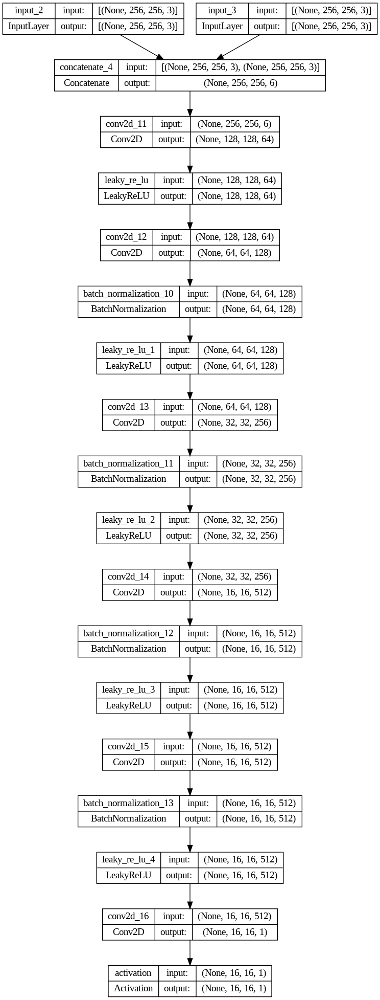

In [ ]:
def define_discriminator(image_shape=(256, 256, 3)):

	# weight initialization
	init = RandomNormal(stddev=0.02) #As described in the original paper

	# source image input
	in_src_image = Input(shape=image_shape)  #Image we want to convert to another image
	# target image input
	in_target_image = Input(shape=image_shape)  #Image we want to generate after training.

	# concatenate images, channel-wise
	merged = Concatenate()([in_src_image, in_target_image])

	# C64: 4x4 kernel Stride 2x2
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer='he_normal')(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128: 4x4 kernel Stride 2x2
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer='he_normal')(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256: 4x4 kernel Stride 2x2
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer='he_normal')(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512: 4x4 kernel Stride 2x2
    # Not in the original paper. Comment this block if you want.
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer='he_normal')(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# second last output layer : 4x4 kernel but Stride 1x1
	d = Conv2D(512, (4,4), padding='same', kernel_initializer='he_normal')(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), padding='same', kernel_initializer='he_normal')(d)
	patch_out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], patch_out)
	# compile model
    #The model is trained with a batch size of one image and Adam opt.
    #with a small learning rate and 0.5 beta.
    #The loss for the discriminator is weighted by 50% for each model update.

	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

disc_model = define_discriminator((256,256,3))
plot_model(disc_model, to_file='disc_model.png', show_shapes=True)

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
# Load the pre-trained VGG16 model trained on ImageNet

def define_generator(image_shape=(256, 256, 3)):
    vgg16 = VGG16(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

    # Freeze the weights of the VGG16 model
    vgg16.trainable = False

    # Get the output of the last convolutional layer in VGG16
    vgg16_output = vgg16.get_layer('block5_conv3').output

    # Contraction path
    p444 = vgg16_output

    c555 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p444)
    c555 = tf.keras.layers.BatchNormalization()(c555)
    c555 = tf.keras.layers.Dropout(0.3)(c555)
    c555 = tf.keras.layers.Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c555)
    c555 = tf.keras.layers.BatchNormalization()(c555)

    # Expansive path
    u666 = tf.keras.layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c555)
    u666 = tf.keras.layers.concatenate([u666, vgg16.get_layer('block4_conv3').output])
    c666 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u666)
    c666 = tf.keras.layers.BatchNormalization()(c666)
    c666 = tf.keras.layers.Dropout(0.2)(c666)
    c666 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c666)
    c666 = tf.keras.layers.BatchNormalization()(c666)

    u777 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c666)
    u777 = tf.keras.layers.concatenate([u777, vgg16.get_layer('block3_conv3').output])
    c777 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u777)
    c777 = tf.keras.layers.BatchNormalization()(c777)
    c777 = tf.keras.layers.Dropout(0.2)(c777)
    c777 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c777)
    c777 = tf.keras.layers.BatchNormalization()(c777)

    u888 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c777)
    u888 = tf.keras.layers.concatenate([u888, vgg16.get_layer('block2_conv2').output])
    c888 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u888)
    c888 = tf.keras.layers.BatchNormalization()(c888)
    c888 = tf.keras.layers.Dropout(0.1)(c888)
    c888 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c888)
    c888 = tf.keras.layers.BatchNormalization()(c888)

    u999 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c888)
    u999 = tf.keras.layers.concatenate([u999, vgg16.get_layer('block1_conv2').output], axis=3)
    c999 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u999)
    c999 = tf.keras.layers.BatchNormalization()(c999)
    c999 = tf.keras.layers.Dropout(0.1)(c999)
    c999 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c999)
    c999 = tf.keras.layers.BatchNormalization()(c999)

    outputs3 = tf.keras.layers.Conv2D(3, (1, 1), activation='sigmoid')(c999)

    model = tf.keras.Model(inputs=[vgg16.input], outputs=[outputs3])
    return model

# Create the model using the defined function
gen_model = define_generator()
gen_model.summary()

58889256/58889256 [==============================] - 4s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 256, 256, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 block1_conv2 (Conv2D)       (None, 256, 256, 64)         36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)         0         ['block1_conv2[0][0]']        
                             

In [ ]:
def define_gan(g_model, d_model, image_shape):
    # make weights in the discriminator not trainable
    for layer in d_model.layers:
        if not isinstance(layer, BatchNormalization):
            layer.trainable = False       #Descriminator layers set to untrainable in the combined GAN but
                                                #standalone descriminator will be trainable.

    # define the source image
    in_src = Input(shape=image_shape)
    # suppy the image as input to the generator
    gen_out = g_model(in_src)
    # supply the input image and generated image as inputs to the discriminator
    dis_out = d_model([in_src, gen_out])
    # src image as input, generated image and disc. output as outputs
    model = Model(in_src, [dis_out, gen_out])
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)

    #Total loss is the weighted sum of adversarial loss (BCE) and L1 loss (MAE)
    #Authors suggested weighting BCE vs L1 as 1:100.
    model.compile(loss=['binary_crossentropy', 'MSE'],
               optimizer=opt, loss_weights=[1,100])
    return model

In [ ]:
###########################################################################################NEW
# select a batch of random samples, returns images and target
def generate_real_samples(dataset, n_samples, patch_shape):
    # unpack dataset
    trainA, trainB = dataset
    # choose random instances
    ix = randint(0, trainA.shape[0], n_samples)
    # retrieve selected images
    X1, X2 = trainA[ix], trainB[ix]
    # generate 'real' class labels (1)
    y = ones((n_samples, patch_shape, patch_shape, 1))
    return [X1, X2], y

# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, samples, patch_shape):
    # generate fake instance
    X = g_model.predict(samples)
    # create 'fake' class labels (0)
    y = zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

# generate samples and save as a plot and save the model
#GAN models do not converge, we just want to find a good balance between
#the generator and the discriminator. Therefore, it makes sense to periodically
#save the generator model and check how good the generated image looks.
def summarize_performance(step, g_model, dataset, n_samples=3):
    # select a sample of input images
    [X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
    # generate a batch of fake samples
    X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)
    # scale all pixels from [-1,1] to [0,1]
    #X_realA = (X_realA + 1) / 2.0
    #X_realB = (X_realB + 1) / 2.0
    #X_fakeB = (X_fakeB + 1) / 2.0
    # plot real source images
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + i)
        plt.axis('off')
        plt.imshow(X_realA[i])
    # plot generated target image
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + n_samples + i)
        plt.axis('off')
        plt.imshow(X_fakeB[i])
    # plot real target image
    for i in range(n_samples):
        plt.subplot(3, n_samples, 1 + n_samples*2 + i)
        plt.axis('off')
        plt.imshow(X_realB[i])
    # save plot to file
    filename1 = 'plot_%06d.png' % (step+1)
    plt.savefig(filename1)
    plt.close()
    # save the generator model
    filename2 = 'model_%06d.h5' % (step+1)
    g_model.save(filename2)
    print('>Saved: %s and %s' % (filename1, filename2))
discriminator_losses= []
generator_losses = []

discriminator_losses_per_epoch = []
generator_losses_per_epoch = []
# train pix2pix models
def train(d_model, g_model, gan_model, dataset, n_epochs=10, n_batch=1):
    # determine the output square shape of the discriminator
    n_patch = d_model.output_shape[1]
    # unpack dataset
    trainA, trainB = dataset
    # calculate the number of batches per training epoch
    bat_per_epo = int(len(trainA) / n_batch)
    # calculate the number of training iterations
    n_steps = bat_per_epo * n_epochs
    # manually enumerate epochs

    for i in range(n_steps):
        # select a batch of real samples
        [X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
        # generate a batch of fake samples
        X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
        # update discriminator for real samples
        d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
        # update discriminator for generated samples
        d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
        # update the generator
        g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
        # summarize performance
        discriminator_losses.append(0.5 * (d_loss1 + d_loss2))
        generator_losses.append(g_loss)
        print('>%d, d1[%.3f] d2[%.3f] g[%.3f]' % (i+1, d_loss1, d_loss2, g_loss))
        # summarize model performance
        if (i+1) % (bat_per_epo * 10) == 0:
            summarize_performance(i, g_model, dataset)


    for epoch in range(n_epochs):
        epoch_discriminator_losses = []
        epoch_generator_losses = []

        for i in range(bat_per_epo):

            epoch_discriminator_losses.append(0.5 * (d_loss1 + d_loss2))
            epoch_generator_losses.append(g_loss)

        mean_discriminator_loss = np.mean(epoch_discriminator_losses)
        mean_generator_loss = np.mean(epoch_generator_losses)
        discriminator_losses_per_epoch.append(mean_discriminator_loss)
        generator_losses_per_epoch.append(mean_generator_loss)

In [ ]:
!unzip /content/drive/MyDrive/Train_40mix.zip -d /content/Train_40mix

Archive:  /content/drive/MyDrive/Train_40mix.zip
   creating: /content/Train_40mix/Train/
   creating: /content/Train_40mix/Train/MAC/
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S01.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S02.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S03.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S04.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S05.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S06.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S07.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S08.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S09.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S10.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S11.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S12.dcm  
  inflating: /content/Train_40mix/Train/MAC/MACWAP011S13.dcm  
  inflating: /content/Train_40mix/Train/MAC/MA

In [ ]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3
IMG_SHAPE = (IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS)

# Set the path to the "MAC" directory
NAC_PATH = '/content/Train_40mix/Train/NAC'
MAC_PATH = '/content/Train_40mix/Train/MAC'

# Get a list of all the DICOM files in the "NAC" and "MAC" directory
files = [f for f in os.listdir(NAC_PATH)]
files = sorted(files)
files1 = [e for e in os.listdir(MAC_PATH)]
files1 = sorted(files1)

# Create an empty array to store the images
src_images = np.zeros((len(files), IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS), dtype=np.float32)
tar_images = np.zeros((len(files1), IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS), dtype=np.float32)

src_images_p = np.zeros((len(files), IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS), dtype=np.float32)
tar_images_p = np.zeros((len(files1), IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS), dtype=np.float32)

# Loop over each DICOM file and read the image
for i, file_name in enumerate(files):
    # Construct the full path to the DICOM file
    file_path = os.path.join(NAC_PATH, file_name)
    # Read the DICOM file and extract the pixel data
    dcm = pydicom.dcmread(file_path)
    pixel_data = dcm.pixel_array
    # Rescale the pixel values to be between 0 and 1
    pixel_data_src = (pixel_data) / (np.max(pixel_data))
    pixel_data_scr_p = (pixel_data-(np.max(pixel_data)/2)) / ((np.max(pixel_data)/2))

    #RGB
    pixel_data_src = np.tile(pixel_data_src[:, :, np.newaxis], [1, 1, IMG_CHANNELS])
    pixel_data_scr_p = np.tile(pixel_data_scr_p[:, :, np.newaxis], [1, 1, IMG_CHANNELS])

    # Add the pixel data to the X_train array
    src_images[i] = pixel_data_src
    #src_images_p[i] = pixel_data_scr_p

for j, file_name1 in enumerate(files1):
    # Construct the full path to the DICOM file
    file_path1 = os.path.join(MAC_PATH, file_name1)
    # Read the DICOM file and extract the pixel data
    dcm1 = pydicom.dcmread(file_path1)
    pixel_data1 = dcm1.pixel_array
    # Rescale the pixel values to be between 0 and 1
    pixel_data1_tar = (pixel_data1) / (np.max(pixel_data1))
    pixel_data1_tar_p = (pixel_data1-(np.max(pixel_data1)/2)) / ((np.max(pixel_data1))/2)

    #RGB
    pixel_data1_tar = np.tile(pixel_data1_tar[:, :, np.newaxis], [1, 1, IMG_CHANNELS])
    pixel_data1_tar_p = np.tile(pixel_data1_tar_p[:, :, np.newaxis], [1, 1, IMG_CHANNELS])

    # Add the pixel data to the Y_train array
    tar_images[j] = pixel_data1_tar
    #tar_images_p[j] = pixel_data1_tar_p


In [ ]:
image_shape = src_images.shape[1:]
# define the models
d_model = define_discriminator(image_shape)
g_model = define_generator(image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)

#Define data
# load and prepare training images
data = [src_images, tar_images]

def preprocess_data(data):
    # load compressed arrays
    # unpack arrays
    X1, X2 = data[0], data[1]
    # scale from [0,255] to [-1,1]
    #######################################
    ############# May be Wrong ############
    #######################################
    X1 = src_images
    X2 = tar_images
    return [X1, X2]

dataset = preprocess_data(data)

from datetime import datetime
start1 = datetime.now()
model_A = train(d_model, g_model, gan_model, dataset, n_epochs=10, n_batch=1)
#Reports parameters for each batch (total 1096) for each epoch.
#For 10 epochs we should see 10960

stop1 = datetime.now()
#Execution time of the model
execution_time = stop1-start1
print("Execution time is: ", execution_time)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 25ms/step
>16302, d1[0.361] d2[0.380] g[1.031]
1/1 [==============================] - 0s 24ms/step
>16303, d1[0.371] d2[0.382] g[0.829]
1/1 [==============================] - 0s 26ms/step
>16304, d1[0.373] d2[0.382] g[0.966]
1/1 [==============================] - 0s 20ms/step
>16305, d1[0.367] d2[0.379] g[1.026]
1/1 [==============================] - 0s 20ms/step
>16306, d1[0.377] d2[0.386] g[1.027]
1/1 [==============================] - 0s 21ms/step
>16307, d1[0.360] d2[0.386] g[0.917]
1/1 [==============================] - 0s 20ms/step
>16308, d1[0.369] d2[0.380] g[1.153]
1/1 [==============================] - 0s 20ms/step
>16309, d1[0.368] d2[0.383] g[1.021]
1/1 [==============================] - 0s 21ms/step
>16310, d1[0.355] d2[0.384] g[0.879]
1/1 [==============================] - 0s 20ms/step
>16311, d1[0.353] d2[0.385] g[0.881]
1/1 [==============================] - 0s 20ms/step
>16312,

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


>Saved: plot_018800.png and model_018800.h5
Execution time is:  1:09:00.716881


In [ ]:
g_model.save('CGAN_TF_on_Gen.h5')

In [ ]:
plt.plot(range(0, 1203200), discriminator_losses, label='Discriminator Loss')
plt.plot(range(1, 1203201), generator_losses, label='Generator Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Plot the discriminator loss
plt.plot(range(0, 1203200), discriminator_losses, label='Discriminator Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.title('Discriminator Loss')
plt.show()

# Plot the generator loss
plt.plot(range(1, 1203201), generator_losses, label='Generator Loss', color='orange')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.legend()
plt.title('Generator Loss')
plt.show()

In [ ]:
from numpy import asarray
from numpy import savetxt
# define data
a = asarray(discriminator_losses)
# save to csv file
savetxt('discriminator_losses_TF_both.csv', a)
b = asarray(generator_losses)
# save to csv file
savetxt('generator_losses_TF_both.csv', b)

In [ ]:
!unzip /content/drive/MyDrive/Test_mix.zip -d /content/Test_mix

Archive:  /content/drive/MyDrive/Test_mix.zip
   creating: /content/Test_mix/Test_mix/
   creating: /content/Test_mix/Test_mix/MAC/
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S01.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S02.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S03.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S04.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S05.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S06.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S07.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S08.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S09.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S10.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S11.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S12.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWAP001S13.dcm  
  inflating: /content/Test_mix/Test_mix/MAC/MACWA

In [ ]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3
IMG_SHAPE = (IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS)

# Set the path to the "MAC" directory
NAC_Test = '/content/Test_mix/Test_mix/NAC'
MAC_Test = '/content/Test_mix/Test_mix/MAC'

# Get a list of all the DICOM files in the "NAC" and "MAC" directory
# Get a list of all the DICOM files in the "NAC" and "MAC" directory
files2 = [f for f in os.listdir(NAC_Test)]
files2 = sorted(files2)
files3 = [e for e in os.listdir(MAC_Test)]
files3 = sorted(files3)

# Create an empty array to store the images
src_images2 = np.zeros((len(files2), IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS), dtype=np.float32)
tar_images2 = np.zeros((len(files3), IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS), dtype=np.float32)

src_images_p2 = np.zeros((len(files2), IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS), dtype=np.float32)
tar_images_p2 = np.zeros((len(files3), IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS), dtype=np.float32)


# Loop over each DICOM file and read the image
for i, file_name2 in enumerate(files2):
    # Construct the full path to the DICOM file
    file_path2 = os.path.join(NAC_Test, file_name2)
    # Read the DICOM file and extract the pixel data
    dcm2 = pydicom.dcmread(file_path2)
    pixel_data2 = dcm2.pixel_array
    # Rescale the pixel values to be between 0 and 1
    pixel_data_src2 = (pixel_data2) / (np.max(pixel_data2))
    pixel_data_scr_p2 = (pixel_data2-(np.max(pixel_data2)/2)) / ((np.max(pixel_data2)/2))
    # Add the pixel data to the X_train array

    pixel_data_src2 = np.tile(pixel_data_src2[:, :, np.newaxis], [1, 1, IMG_CHANNELS])
    pixel_data_scr_p2 = np.tile(pixel_data_scr_p2[:, :, np.newaxis], [1, 1, IMG_CHANNELS])
    src_images2[i] = pixel_data_src2
    #src_images_p2[i] = pixel_data_scr_p2

for j, file_name3 in enumerate(files3):
    # Construct the full path to the DICOM file
    file_path3 = os.path.join(MAC_Test, file_name3)
    # Read the DICOM file and extract the pixel data
    dcm3 = pydicom.dcmread(file_path3)
    pixel_data3 = dcm3.pixel_array
    # Rescale the pixel values to be between 0 and 1
    pixel_data1_tar3 = (pixel_data3) / (np.max(pixel_data3))
    pixel_data1_tar_p3 = (pixel_data3-(np.max(pixel_data3)/2)) / ((np.max(pixel_data3))/2)

    pixel_data1_tar3 = np.tile(pixel_data1_tar3[:, :, np.newaxis], [1, 1, IMG_CHANNELS])
    pixel_data1_tar_p3 = np.tile(pixel_data1_tar_p3[:, :, np.newaxis], [1, 1, IMG_CHANNELS])
    # Add the pixel data to the Y_train array
    tar_images2[j] = pixel_data1_tar3
    #tar_images_p2[j] = pixel_data1_tar_p3

In [ ]:
predicted_images = np.zeros((len(files2), 256, 256, 3), dtype=np.float32)
for i in range(len(files2)):
    # Get the input image from X_test
    input_image = src_images[i]
    input_image = np.expand_dims(input_image, axis=0)  # Add an extra dimension for the batch size

    # Perform the prediction using your U-Net algorithm
    predicted_image = g_model.predict(input_image)  # Replace 'your_unet_algorithm' with your actual prediction function

    # Store the predicted image in the array
    predicted_images[i] = predicted_image

1/1 [==============================] - 0s 23ms/step


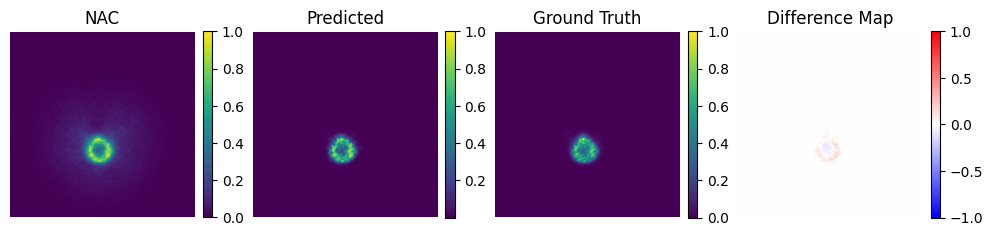

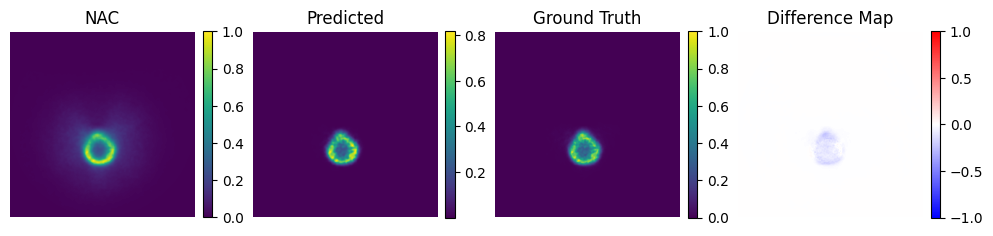

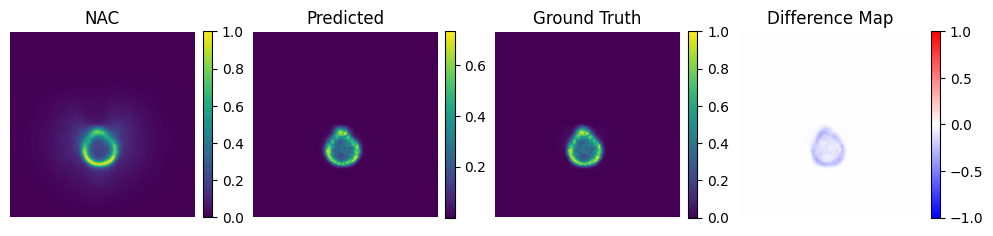

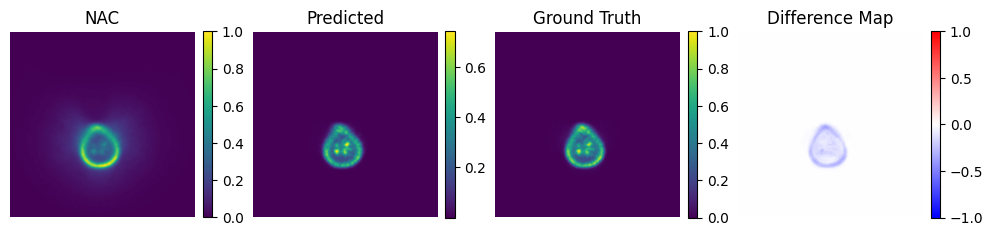

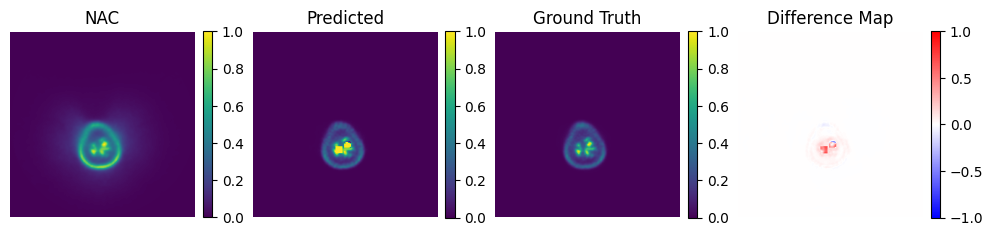

...

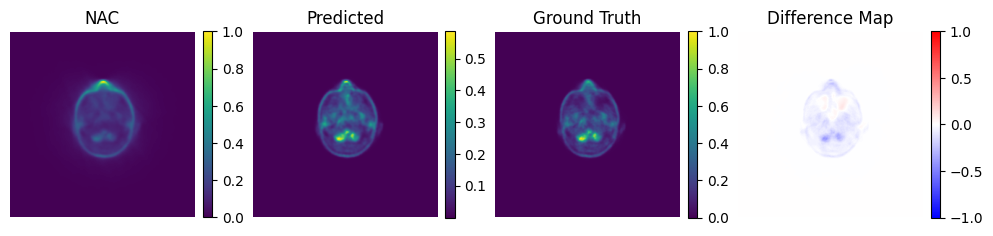

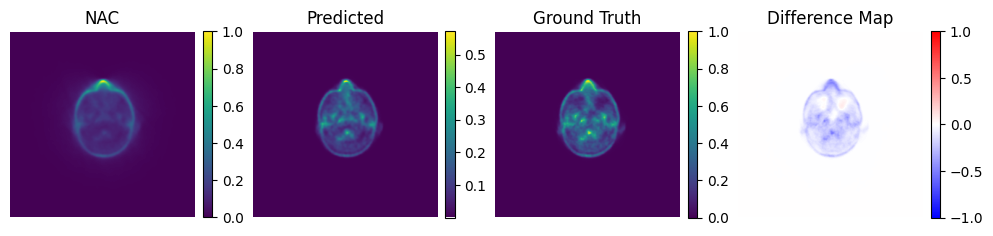

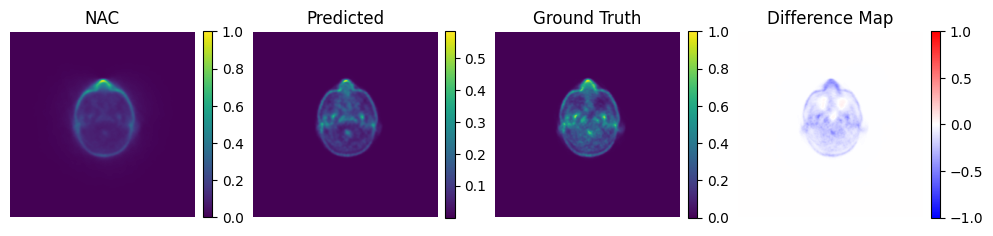

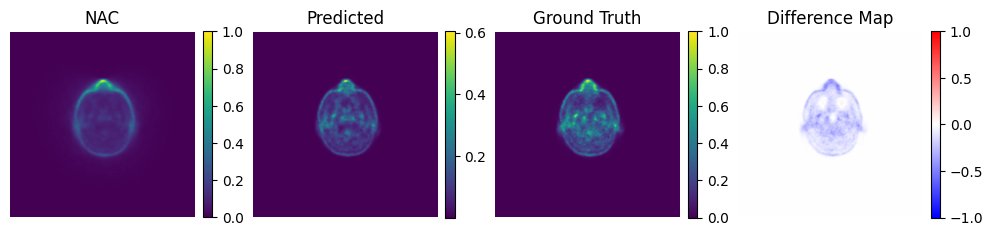

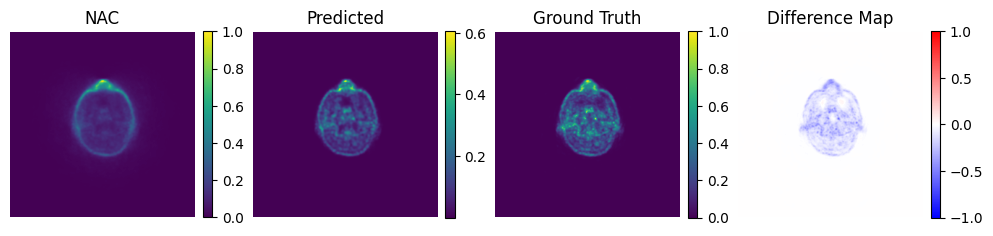

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


# Loop over the predicted images, ground truth, and create the difference map for each slice
for i in range(len(files2)):
    # Create a new figure for each predicted image, ground truth, and difference map
    fig, axes = plt.subplots(1, 4, figsize=(12, 6))

    # Get the predicted image, ground truth, and compute the difference map
    predicted_image = predicted_images[i,:,:,0]
    ground_truth_image = tar_images[i,:,:,0]
    difference_map = (predicted_image - ground_truth_image)


    im = axes[0].imshow(src_images[i,:,:,0].squeeze())
    axes[0].axis('off')
    axes[0].set_title('NAC')
    cbar = fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)

    # Plot the predicted image
    im1 = axes[1].imshow(predicted_image.squeeze())
    axes[1].axis('off')
    axes[1].set_title('Predicted')
    cbar1 = fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

    # Plot the ground truth image
    im2 = axes[2].imshow(ground_truth_image.squeeze())
    axes[2].axis('off')
    axes[2].set_title('Ground Truth')
    cbar2 = fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

    # Plot the difference map
    im3 = axes[3].imshow(difference_map.squeeze(), cmap='bwr', vmin=-1, vmax=1)  # You can adjust vmin and vmax accordingly
    axes[3].axis('off')
    axes[3].set_title('Difference Map')
    cbar3 = fig.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)

    # Show the figure
    plt.show()
